# [DreamGaussian](https://github.com/dreamgaussian/dreamgaussian) image-to-3D demo

In [1]:
#@title install (only run once)
# %rm -r dreamgaussian
# !git clone https://github.com/dreamgaussian/dreamgaussian

# install dependencies
# !pip install -q einops plyfile dearpygui huggingface_hub diffusers accelerate transformers xatlas trimesh PyMCubes pymeshlab rembg[gpu,cli] omegaconf ninja

# build extension from source (can be slow)
# !git clone --recursive https://github.com/ashawkey/diff-gaussian-rasterization
# !pip install -q ./diff-gaussian-rasterization
# !pip install -q ./simple-knn

# pre-built wheels (faster)
# !pip install -q https://github.com/camenduru/diff-gaussian-rasterization/releases/download/v1.0/diff_gaussian_rasterization-0.0.0-cp310-cp310-linux_x86_64.1.whl
# !pip install -q https://github.com/camenduru/diff-gaussian-rasterization/releases/download/v1.0/simple_knn-0.0.0-cp310-cp310-linux_x86_64.1.whl

# nvdiffrast
# !pip install -q git+https://github.com/NVlabs/nvdiffrast

# kiuikit
# !pip install -q git+https://github.com/ashawkey/kiuikit

# %mkdir -p data

/home/taras/Documents/ucu/mmml/splatfusion3d/dreamgaussian/data
/home/taras/Documents/ucu/mmml/splatfusion3d/dreamgaussian


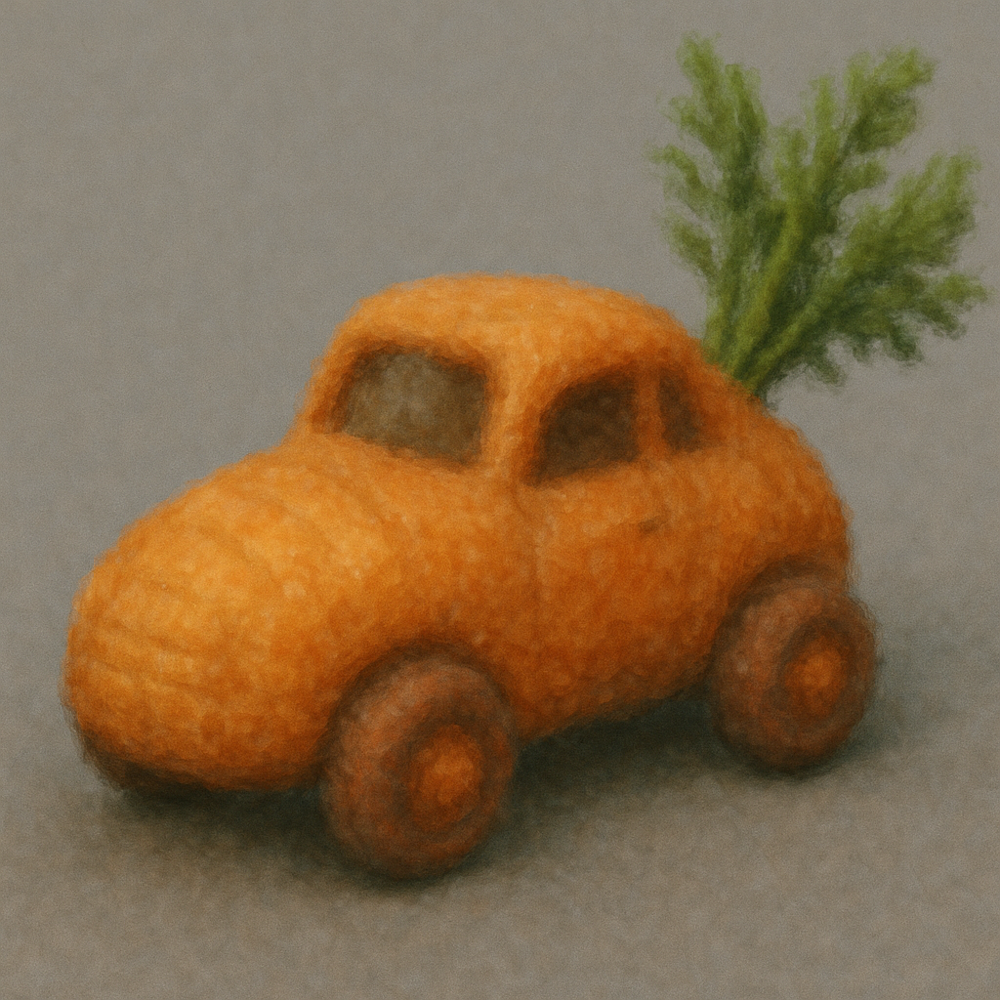

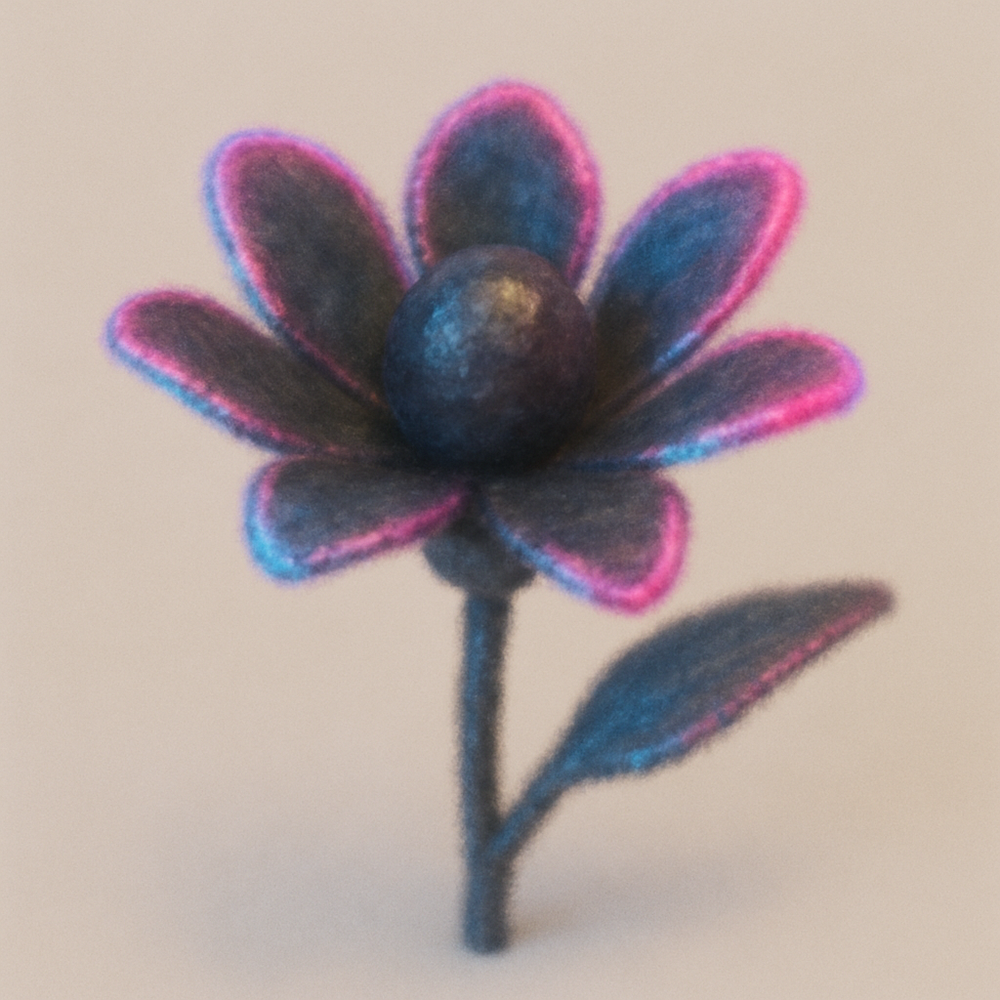

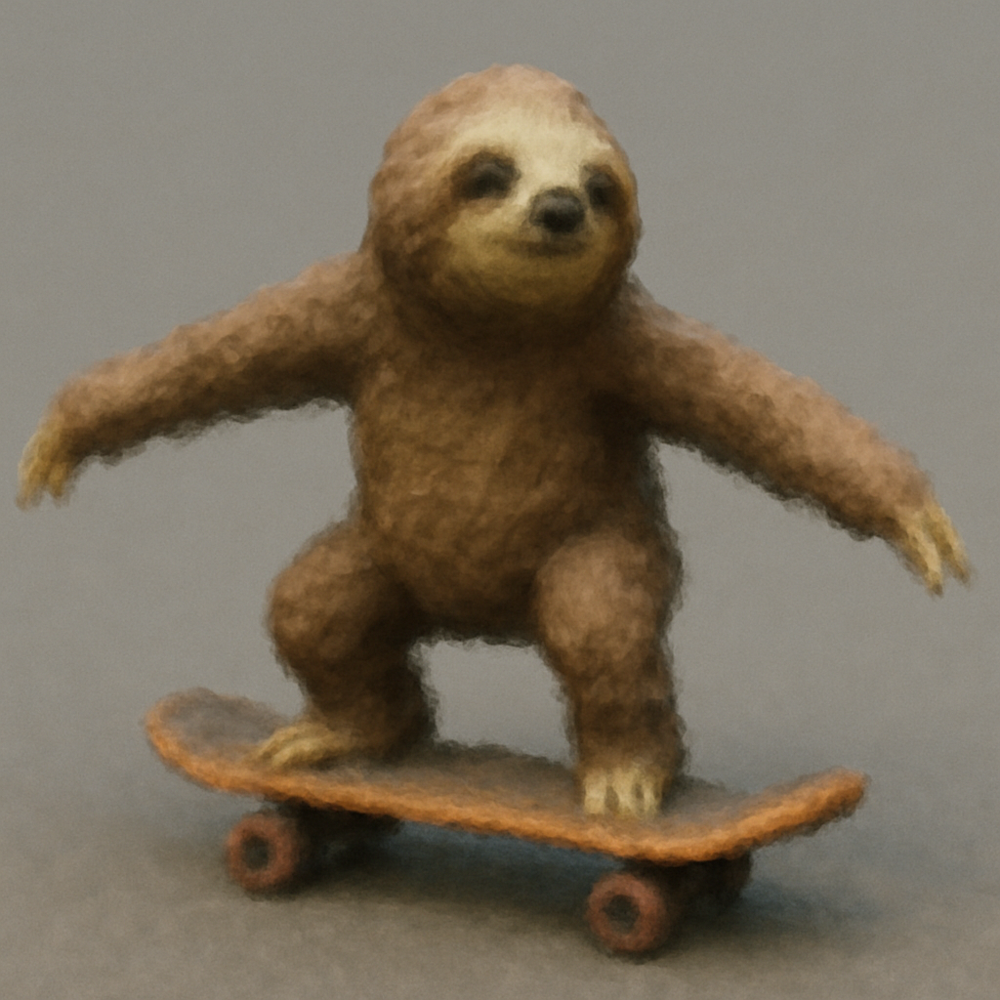

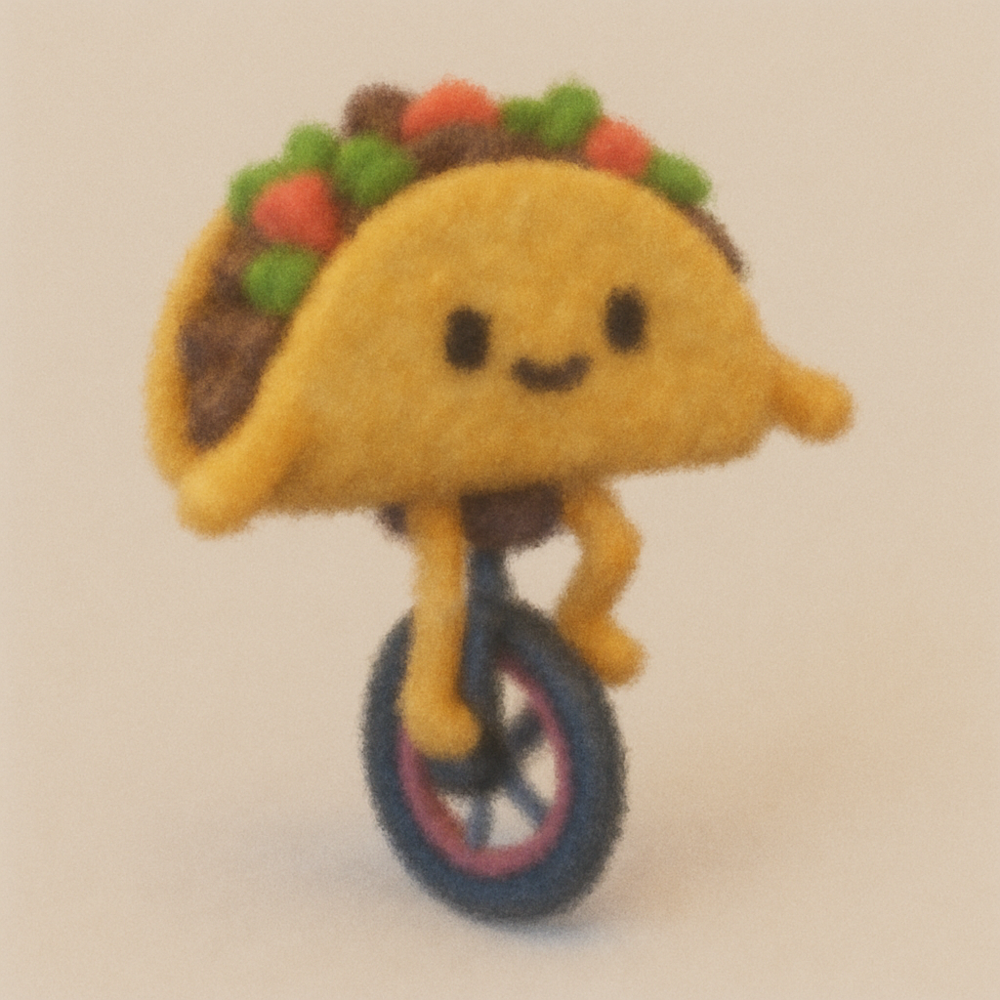

In [ ]:
#@title upload image

import os

%cd dreamgaussian/data/
# IMAGE = os.path.basename('bombardiro.png') # filename
image1 = 'car.png'
image2 = 'flower.png'
image3 = 'sloth.png'
image4 = 'taco.png'
%cd ..

# display image
from IPython.display import Image, display
# display(Image(f'data/{IMAGE}', width=256, height=256))
display(Image(f'data/{image1}', width=256, height=256))
display(Image(f'data/{image2}', width=256, height=256))
display(Image(f'data/{image3}', width=256, height=256))
display(Image(f'data/{image4}', width=256, height=256))

[INFO] loading image data/car.png...
[INFO] background removal...
[INFO] recenter...
[INFO] loading image data/flower.png...
[INFO] background removal...
[INFO] recenter...
[INFO] loading image data/sloth.png...
[INFO] background removal...
[INFO] recenter...
[INFO] loading image data/tako.png...
[INFO] background removal...
[INFO] recenter...


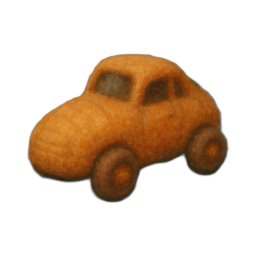

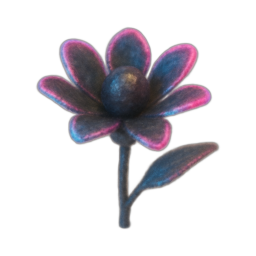

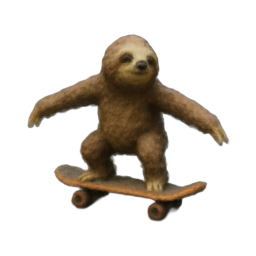

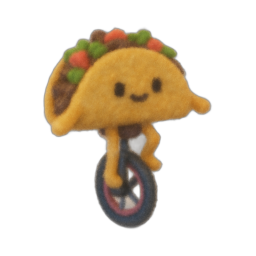

In [2]:
#@title preprocess image

# preprocess
# %run process.py data/{IMAGE}
%run process.py data/{image1}
%run process.py data/{image2}
%run process.py data/{image3}
%run process.py data/{image4}

# NAME = os.path.splitext(IMAGE)[0]
# IMAGE_PROCESSED = NAME + '_rgba.png'
name1 = os.path.splitext(image1)[0]
name2 = os.path.splitext(image2)[0]
name3 = os.path.splitext(image3)[0]
name4 = os.path.splitext(image4)[0]
IMAGE_PROCESSED1 = name1 + '_rgba.png'  
IMAGE_PROCESSED2 = name2 + '_rgba.png'
IMAGE_PROCESSED3 = name3 + '_rgba.png'
IMAGE_PROCESSED4 = name4 + '_rgba.png'

# display processed image
from IPython.display import Image, display
# display(Image(f'data/{IMAGE_PROCESSED}', width=256, height=256))
display(Image(f'data/{IMAGE_PROCESSED1}', width=256, height=256))
display(Image(f'data/{IMAGE_PROCESSED2}', width=256, height=256))
display(Image(f'data/{IMAGE_PROCESSED3}', width=256, height=256))
display(Image(f'data/{IMAGE_PROCESSED4}', width=256, height=256))

# Settings
* Elevation: estimated elevation angle, default to 0 (horizontal), range from [-90, 90]. If you upload a look-down image, try a value like -30.

In [5]:
#@markdown ####**Settings:**
Elevation = 0 #@param {type: 'integer'}

In [ ]:
# prompt_list = [
#     "A car made of carrots",
#     "A techno‑organic flower with metallic petals edged in pulsating neon pink and blue",
#     "Tiny Taco Riding a Unicycle",
#     "Sloth on a Skateboard",
# ]

/home/taras/Documents/ucu/mmml/splatfusion3d/dreamgaussian


In [8]:

# %run main.py --config configs/image.yaml input=data/{IMAGE_PROCESSED} save_path={NAME} elevation={Elevation} force_cuda_rast=True
%run main.py --config configs/image.yaml input=data/{IMAGE_PROCESSED1} save_path={name1} elevation={Elevation} force_cuda_rast=True
%run main.py --config configs/image.yaml input=data/{IMAGE_PROCESSED2} save_path={name2} elevation={Elevation} force_cuda_rast=True
%run main.py --config configs/image.yaml input=data/{IMAGE_PROCESSED3} save_path={name3} elevation={Elevation} force_cuda_rast=True
%run main.py --config configs/image.yaml input=data/{IMAGE_PROCESSED4} save_path={name4} elevation={Elevation} force_cuda_rast=True

[INFO] load image from data/car_rgba.png...
Number of points at initialisation :  5000
[INFO] loading zero123...


Keyword arguments {'trust_remote_code': True} are not expected by Zero123Pipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Expected types for clip_camera_projection: (<class 'zero123.CLIPCameraProjection'>,), got <class 'diffusers_modules.local.zero123.CLIPCameraProjection'>.


[INFO] loaded zero123!


100%|██████████| 500/500 [00:41<00:00, 11.98it/s]
/home/taras/miniconda3/envs/dreamenv/lib/python3.10/site-packages/torch/functional.py:554: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:4314.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[INFO] save model to logs/car_model.ply.


Tensor occ torch.Size([128, 128, 128]) torch.float32 cuda:0 ∈ [0.0, 64.00825500488281] μ = 0.9065564870834351 σ = 
2.864847421646118

[INFO] mesh cleaning: (61852, 3) --> (33904, 3), (123720, 3) --> (67832, 3)
[INFO] marching cubes result: torch.Size([33904, 3]) (-0.7210732698440552-0.7260416150093079), torch.Size([67832, 3])
[INFO] unwrap uv...


/home/taras/Documents/ucu/mmml/splatfusion3d/dreamgaussian/mesh.py:348: UserWarning: Using torch.cross without specifying the dim arg is deprecated.
Please either pass the dim explicitly or simply use torch.linalg.cross.
The default value of dim will change to agree with that of linalg.cross in a future release. (Triggered internally at /pytorch/aten/src/ATen/native/Cross.cpp:62.)
  face_normals = torch.cross(v1 - v0, v2 - v0)
/home/taras/miniconda3/envs/dreamenv/lib/python3.10/site-packages/torch/utils/cpp_extension.py:2356: UserWarning: TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
If this is not desired, please set os.environ['TORCH_CUDA_ARCH_LIST'].
  warnings.warn(


[INFO] save model to logs/car_mesh.obj.
[INFO] load image from data/flower_rgba.png...
Number of points at initialisation :  5000
[INFO] loading zero123...


Keyword arguments {'trust_remote_code': True} are not expected by Zero123Pipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Expected types for clip_camera_projection: (<class 'zero123.CLIPCameraProjection'>,), got <class 'diffusers_modules.local.zero123.CLIPCameraProjection'>.


[INFO] loaded zero123!


100%|██████████| 500/500 [00:42<00:00, 11.70it/s]


[INFO] save model to logs/flower_model.ply.


Tensor occ torch.Size([128, 128, 128]) torch.float32 cuda:0 ∈ [0.0, 37.08973693847656] μ = 0.20271700620651245 σ = 
1.1626633405685425

[INFO] mesh cleaning: (31598, 3) --> (28716, 3), (63192, 3) --> (57456, 3)
[INFO] marching cubes result: torch.Size([28716, 3]) (-0.7313179969787598-0.7713263034820557), torch.Size([57456, 3])
[INFO] unwrap uv...
[INFO] save model to logs/flower_mesh.obj.
[INFO] load image from data/sloth_rgba.png...
Number of points at initialisation :  5000
[INFO] loading zero123...


Keyword arguments {'trust_remote_code': True} are not expected by Zero123Pipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Expected types for clip_camera_projection: (<class 'zero123.CLIPCameraProjection'>,), got <class 'diffusers_modules.local.zero123.CLIPCameraProjection'>.


[INFO] loaded zero123!


100%|██████████| 500/500 [00:42<00:00, 11.85it/s]


[INFO] save model to logs/sloth_model.ply.


Tensor occ torch.Size([128, 128, 128]) torch.float32 cuda:0 ∈ [0.0, 58.09366226196289] μ = 0.6972333192825317 σ = 
3.106797218322754

[INFO] mesh cleaning: (40512, 3) --> (20170, 3), (81024, 3) --> (40340, 3)
[INFO] marching cubes result: torch.Size([20170, 3]) (-0.6970483064651489-0.6484464406967163), torch.Size([40340, 3])
[INFO] unwrap uv...
[INFO] save model to logs/sloth_mesh.obj.
[INFO] load image from data/tako_rgba.png...
Number of points at initialisation :  5000
[INFO] loading zero123...


Keyword arguments {'trust_remote_code': True} are not expected by Zero123Pipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Expected types for clip_camera_projection: (<class 'zero123.CLIPCameraProjection'>,), got <class 'diffusers_modules.local.zero123.CLIPCameraProjection'>.


[INFO] loaded zero123!


100%|██████████| 500/500 [00:41<00:00, 11.92it/s]


[INFO] save model to logs/tako_model.ply.


Tensor occ torch.Size([128, 128, 128]) torch.float32 cuda:0 ∈ [0.0, 40.977394104003906] μ = 0.9010642766952515 σ = 
2.933246612548828

[INFO] mesh cleaning: (56728, 3) --> (28689, 3), (113456, 3) --> (57386, 3)
[INFO] marching cubes result: torch.Size([28689, 3]) (-0.6771445870399475-0.6875173449516296), torch.Size([57386, 3])
[INFO] unwrap uv...
[INFO] save model to logs/tako_mesh.obj.


In [ ]:
#@title training!
# stage 2 
# %run main2.py --config configs/image.yaml input=data/{IMAGE_PROCESSED} save_path={NAME} elevation={Elevation} force_cuda_rast=True
%run main2.py --config configs/image.yaml input=data/{IMAGE_PROCESSED1} save_path={name1} elevation={Elevation} force_cuda_rast=True
%run main2.py --config configs/image.yaml input=data/{IMAGE_PROCESSED2} save_path={name2} elevation={Elevation} force_cuda_rast=True
%run main2.py --config configs/image.yaml input=data/{IMAGE_PROCESSED3} save_path={name3} elevation={Elevation} force_cuda_rast=True
%run main2.py --config configs/image.yaml input=data/{IMAGE_PROCESSED4} save_path={name4} elevation={Elevation} force_cuda_rast=True

[load_obj] use texture from: logs/car_mesh_albedo.png
[load_obj] load texture: (1024, 1024, 3)
[Mesh loading] v: torch.Size([39838, 3]), f: torch.Size([67832, 3])
[Mesh loading] vn: torch.Size([39838, 3]), fn: torch.Size([67832, 3])
[INFO] load image from data/car_rgba.png...
[INFO] loading zero123...


Keyword arguments {'trust_remote_code': True} are not expected by Zero123Pipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Expected types for clip_camera_projection: (<class 'zero123.CLIPCameraProjection'>,), got <class 'diffusers_modules.local.zero123.CLIPCameraProjection'>.


[INFO] loaded zero123!


100%|██████████| 50/50 [00:15<00:00,  3.26it/s]


[INFO] save model to logs/car.obj.
[load_obj] use texture from: logs/flower_mesh_albedo.png
[load_obj] load texture: (1024, 1024, 3)
[Mesh loading] v: torch.Size([35266, 3]), f: torch.Size([57456, 3])
[Mesh loading] vn: torch.Size([35266, 3]), fn: torch.Size([57456, 3])
[INFO] load image from data/flower_rgba.png...
[INFO] loading zero123...


Keyword arguments {'trust_remote_code': True} are not expected by Zero123Pipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Expected types for clip_camera_projection: (<class 'zero123.CLIPCameraProjection'>,), got <class 'diffusers_modules.local.zero123.CLIPCameraProjection'>.


[INFO] loaded zero123!


100%|██████████| 50/50 [00:14<00:00,  3.35it/s]


[INFO] save model to logs/flower.obj.
[load_obj] use texture from: logs/sloth_mesh_albedo.png
[load_obj] load texture: (1024, 1024, 3)
[Mesh loading] v: torch.Size([23919, 3]), f: torch.Size([40340, 3])
[Mesh loading] vn: torch.Size([23919, 3]), fn: torch.Size([40340, 3])
[INFO] load image from data/sloth_rgba.png...
[INFO] loading zero123...


Keyword arguments {'trust_remote_code': True} are not expected by Zero123Pipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Expected types for clip_camera_projection: (<class 'zero123.CLIPCameraProjection'>,), got <class 'diffusers_modules.local.zero123.CLIPCameraProjection'>.


[INFO] loaded zero123!


100%|██████████| 50/50 [00:14<00:00,  3.40it/s]


[INFO] save model to logs/sloth.obj.
[load_obj] use texture from: logs/tako_mesh_albedo.png
[load_obj] load texture: (1024, 1024, 3)
[Mesh loading] v: torch.Size([33645, 3]), f: torch.Size([57386, 3])
[Mesh loading] vn: torch.Size([33645, 3]), fn: torch.Size([57386, 3])
[INFO] load image from data/tako_rgba.png...
[INFO] loading zero123...


Keyword arguments {'trust_remote_code': True} are not expected by Zero123Pipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Expected types for clip_camera_projection: (<class 'zero123.CLIPCameraProjection'>,), got <class 'diffusers_modules.local.zero123.CLIPCameraProjection'>.


[INFO] loaded zero123!


100%|██████████| 50/50 [00:15<00:00,  3.31it/s]


[INFO] save model to logs/tako.obj.


In [13]:
#@title render a video for displaying

# %run -m kiui.render logs/{NAME}.obj --save_video {NAME}.mp4 --wogui --force_cuda_rast

from IPython.display import HTML
from base64 import b64encode

def show_video(video_path, video_width=450):
  video_file = open(video_path, "r+b").read()
  video_url = f"data:video/mp4;base64,{b64encode(video_file).decode()}"
  return HTML(f"""<video width={video_width} controls><source src="{video_url}"></video>""")

# show_video(f'{NAME}.mp4')
%run -m kiui.render logs/{name1}.obj --save_video {name1}.mp4 --wogui --force_cuda_rast
show_video(f'{name1}.mp4')


[INFO] load obj mesh: use texture from: logs/car_albedo.png
[INFO] load obj mesh: load texture: (1024, 1024, 3)
[INFO] load mesh, v: torch.Size([39838, 3]), f: torch.Size([67832, 3])
[INFO] load mesh, vn: torch.Size([39838, 3]), fn: torch.Size([67832, 3])
[INFO] load mesh, vt: torch.Size([39838, 2]), ft: torch.Size([67832, 3])


100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


In [14]:

%run -m kiui.render logs/{name2}.obj --save_video {name2}.mp4 --wogui --force_cuda_rast
show_video(f'{name2}.mp4')

[INFO] load obj mesh: use texture from: logs/flower_albedo.png
[INFO] load obj mesh: load texture: (1024, 1024, 3)
[INFO] load mesh, v: torch.Size([35266, 3]), f: torch.Size([57456, 3])
[INFO] load mesh, vn: torch.Size([35266, 3]), fn: torch.Size([57456, 3])
[INFO] load mesh, vt: torch.Size([35266, 2]), ft: torch.Size([57456, 3])


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


In [15]:

%run -m kiui.render logs/{name3}.obj --save_video {name3}.mp4 --wogui --force_cuda_rast
show_video(f'{name3}.mp4')

[INFO] load obj mesh: use texture from: logs/sloth_albedo.png
[INFO] load obj mesh: load texture: (1024, 1024, 3)
[INFO] load mesh, v: torch.Size([23919, 3]), f: torch.Size([40340, 3])
[INFO] load mesh, vn: torch.Size([23919, 3]), fn: torch.Size([40340, 3])
[INFO] load mesh, vt: torch.Size([23919, 2]), ft: torch.Size([40340, 3])


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


In [16]:

%run -m kiui.render logs/{name4}.obj --save_video {name4}.mp4 --wogui --force_cuda_rast
show_video(f'{name4}.mp4')

[INFO] load obj mesh: use texture from: logs/tako_albedo.png
[INFO] load obj mesh: load texture: (1024, 1024, 3)
[INFO] load mesh, v: torch.Size([33645, 3]), f: torch.Size([57386, 3])
[INFO] load mesh, vn: torch.Size([33645, 3]), fn: torch.Size([57386, 3])
[INFO] load mesh, vt: torch.Size([33645, 2]), ft: torch.Size([57386, 3])


100%|██████████| 1/1 [00:00<00:00,  1.55it/s]
